In [1]:
print("Bismillah Hirrahamaa Nirraheem")

Bismillah Hirrahamaa Nirraheem


In [2]:
import os,sys,time,re,math,warnings
warnings.filterwarnings("ignore")
from IPython.display import clear_output
os.cpu_count()

12

In [3]:
PATH = 'gs://flowers-public/tfrecords-jpeg-331x331/*.tfrec'

In [16]:
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"
import numpy as np
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.io as pio
pio.templates.default = "plotly_dark"
from tqdm import tqdm
import tensorflow as tf
from tensorflow import keras
from tensorflow.io import parse_tensor,parse_single_example,VarLenFeature,FixedLenFeature
from tensorflow.data import TFRecordDataset
tf.get_logger().setLevel("ERROR")

In [5]:
try:
    tpu_cluster = tf.distribute.cluster_resolver.TPUClusterResolver()
    is_tpu = True
except ValueError:
    is_tpu = False
    
if is_tpu:
    tf.config.experimental_connect_to_cluster(tpu_cluster)
    tf.tpu.experimental.initialize_tpu_system(tpu_cluster)
    stratergy = tf.distribute.TPUStrategy(tpu_cluster)
    print(tpu_cluster.cluster_spec().as_dict()["worker"])
elif len(tf.config.list_physical_devices()) > 1:
    strategy = tf.distribute.OneDeviceStrategy("GPU")
else:
    strategy = tf.distribute.OneDeviceStrategy("CPU")
    
print(strategy)
print(strategy.num_replicas_in_sync)

1


In [6]:
all_files = tf.io.gfile.glob(PATH)
train_files = all_files[:11]
valid_files = all_files[11:14]
test_files = all_files[14:]
train_raw = TFRecordDataset(train_files)
valid_raw = TFRecordDataset(valid_files)
test_raw = TFRecordDataset(test_files)

In [7]:
flower_feature = dict(
    image = FixedLenFeature([],tf.string),
    label = FixedLenFeature([],tf.string),
    one_hot_class = VarLenFeature(tf.float32)
)


In [8]:
def transform(example,return_labels):
    
    example = parse_single_example(example,flower_feature)
    img = tf.io.decode_image(example["image"],channels=3)
    img = tf.cast(img,tf.float32)/255.0
    one_hot_class = tf.sparse.to_dense(example["one_hot_class"])
    if return_labels:
        return (img,one_hot_class,example["label"])
    return (img,one_hot_class)


def augument(img,one_hot_class):
    img = tf.image.random_flip_left_right(img)
    img = tf.image.random_contrast(img,0,2)
    return img,one_hot_class


BATCH_SIZE = 8 * strategy.num_replicas_in_sync if is_tpu else 32


def get_dataset(ds:tf.data.Dataset,is_train:bool=False,return_labels:bool=False,batch_size:int=BATCH_SIZE,shuffle_size:int=10000):
    
    if return_labels:
        ds = ds.map(lambda example: transform(example,return_labels),num_parallel_calls=tf.data.AUTOTUNE)
    else:
        ds = ds.map(lambda example: transform(example,return_labels),num_parallel_calls=tf.data.AUTOTUNE)
        ds = ds.map(augument,tf.data.AUTOTUNE)
        
        
    if is_train:
        ds = ds.shuffle(shuffle_size)
        ds = ds.repeat()
        
    ds = ds.batch(BATCH_SIZE,drop_remainder=True,num_parallel_calls=tf.data.AUTOTUNE)
    
    return ds.prefetch(tf.data.AUTOTUNE)

In [9]:
_ = get_dataset(train_raw,is_train=True,return_labels=True)
temp_images,__,temp_labels = _.take(1).get_single_element()

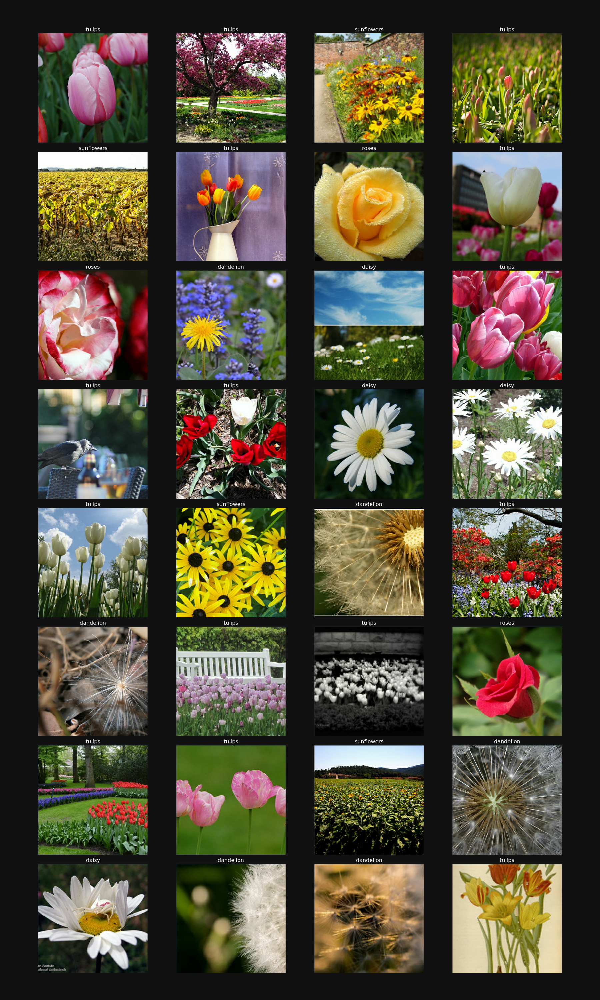

In [10]:
labels_list = []
for _ in temp_labels.numpy().tolist():
    labels_list.append(_.decode())
fig = make_subplots(rows=8,cols=4,subplot_titles=labels_list,horizontal_spacing=0.01,vertical_spacing=0.01)

for _ in range(32):
    fig.add_trace(px.imshow(temp_images[_]).data[0],row=_//4+1,col=_%4+1)
    
fig.update_layout(hovermode=False,height=3000,width=1800)
fig.update_xaxes(showticklabels=False)
fig.update_yaxes(showticklabels=False)
fig.show("png")

In [11]:
CLASSES = ["daisy","dandelion","roses","sunflowers","tulips"]
IMAGE_SIZE = [331,331]

In [12]:
class Petals(keras.models.Model):
    
    def __init__(self,num_classes:int=5,**kwargs):
        
        super(Petals,self).__init__(**kwargs)
        
        self.xception = keras.applications.Xception(input_shape=[*IMAGE_SIZE,3],include_top=False)
        self.xception.trainable = True
        self.pooling = keras.layers.GlobalAveragePooling2D(),
        self.dense_out = keras.layers.Dense(num_classes,activation="softmax")
        
    def call(self,x):
        
        x = self.xception(x)
        x = self.pooling(x)
        x = self.dense_out(x)
        return x

In [13]:
train_instances = sum([int(re.compile(r"-([0-9]*)\.").search(ex).group(1)) for ex in train_files])
valid_instances = sum([int(re.compile(r"-([0-9]*)\.").search(ex).group(1)) for ex in valid_files])
test_instances = sum([int(re.compile(r"-([0-9]*)\.").search(ex).group(1)) for ex in test_files])
steps_per_epoch = train_instances // BATCH_SIZE
validation_steps = valid_instances // BATCH_SIZE

In [14]:
with strategy.scope():
    
    model = Petals()
    optimizer = keras.optimizers.Adam(1e-6)
    training_loss = keras.metrics.Mean(name="training loss")
    training_metric = keras.metrics.Mean(name="training metric")
    
    
per_sample_batch_size = BATCH_SIZE // strategy.num_replicas_in_sync

train_ds = strategy.distribute_datasets_from_function(lambda _: get_dataset(train_raw,is_train=True,return_labels=False,batch_size=per_sample_batch_size))

def train_step(iterator):
    
    def step_fn(inputs):
        
        images,labels = inputs
        
        with tf.GradientTape() as tape:
            
            logits = model(images)
            per_example_loss = keras.losses.categorical_crossentropy(labels,logits,from_logits=True)
            loss = tf.nn.compute_average_loss(per_example_loss)
            
        grads = tape.gradient(loss,model.trainable_variables)
        optimizer.apply_gradients(list(zip(grads,model.trainable_variables)))
        training_loss.update_state(loss*strategy.num_replicas_in_sync)
        training_metric.update_state(labels,logits)
    
    strategy.run(step_fn,args=(next(iterator),))

In [17]:
train_iterator = iter(train_ds)

for epoch in range(5):
    print(f"Epoch: {epoch+1}")
    
    for step in tqdm(range(steps_per_epoch)):
        train_step(train_iterator)
        
    
    print(f"Training loss: {round(training_loss.result(),2)} | Training Metric: {round(training_metric.result(),2)}")

Epoch: 1


  0%|          | 0/79 [03:37<?, ?it/s]


ResourceExhaustedError: Exception encountered when calling BatchNormalization.call().

[1m{{function_node __wrapped__Mul_device_/job:localhost/replica:0/task:0/device:GPU:0}} failed to allocate memory [Op:Mul] name: [0m

Arguments received by BatchNormalization.call():
  • inputs=tf.Tensor(shape=(32, 21, 21, 728), dtype=float32)
  • training=None
  • mask=None